In [2]:
include("functions.jl")
using Plots, JLD2, LaTeXStrings, FileIO

In [139]:
P_no_error = (1 - ((1 - exp(-0.0001*240))))^5

0.8869204367171574

In [140]:
P_1_error = 5*(1 - exp(-0.0001*240))*(1 - ((1 - exp(-0.0001*240))))^4

0.10771789675774326

In [141]:
P_2_error = 10*(1 - exp(-0.0001*240))^2*(1 - ((1 - exp(-0.0001*240))))^3

0.005233003909509474

## Gamma = 1e-3

### Analyzing Error Corrected Data

In [22]:
#Try Trajectory 3,49
@load "Z:/master_work/5_atom_correction/N_atoms=5_γ_decay=0.001_Ntraj=49.jld2"
population_data = population_data;
corrected_population_data = corrected_population_data;
fidelity_data = fidelity_data;
# end_time = end_time;

50001-element Vector{Float64}:
 0.0
 0.0008851664606481791
 3.0475386665784754e-5
 0.0008768151747062802
 2.825417323037982e-5
 0.0008470861939713359
 7.799315790180117e-5
 0.0008282593917101622
 9.105053322855383e-5
 0.0007837016019038856
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

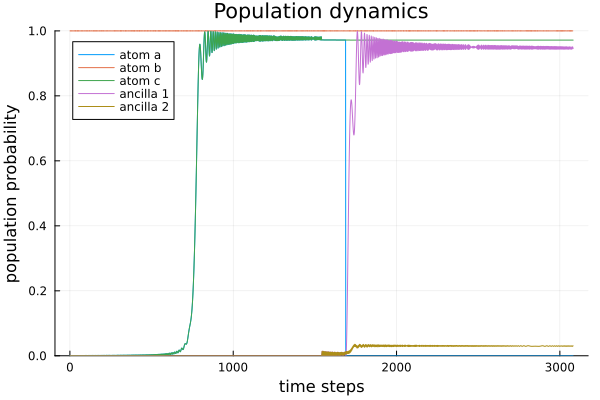

In [23]:
plot(population_data[:a],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(population_data[:b], label="atom b")
plot!(population_data[:c], label="atom c")
plot!(population_data[:a1],label="ancilla 1")
plot!(population_data[:a2], label="ancilla 2")

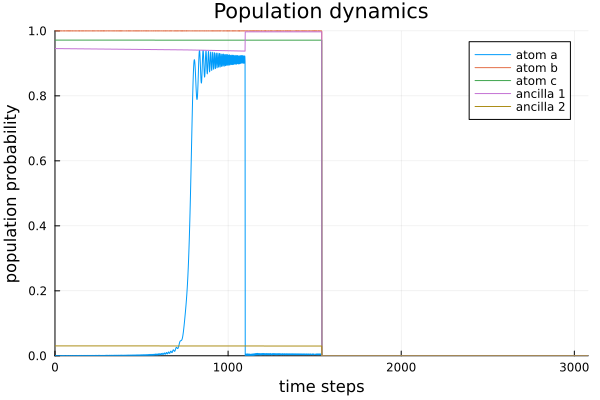

In [24]:
plot(corrected_population_data[:a], xlim=[0,10*tspan[end]],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(corrected_population_data[:b], label="atom b")
plot!(corrected_population_data[:c], label="atom c")
plot!(corrected_population_data[:a1],label="ancilla 1")
plot!(corrected_population_data[:a2], label="ancilla 2")

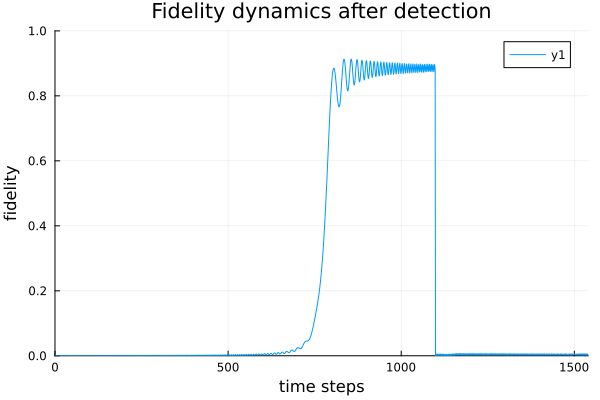

In [25]:
plot(fidelity_data, xlim=[0,10*tspan2[end]], ylim=[0,1], xlabel="time steps", ylabel="fidelity", title="Fidelity dynamics after detection")

### Average analysis

In [56]:
@load "Z:/master_work/5_atom_correction/N_atoms=5_γ_decay=0.001_Ntraj=100_avg.jld2"
avg_population_data = avg_population_data;
avg_corrected_population_data = avg_corrected_population_data;
avg_fidelity_data = avg_fidelity_data;

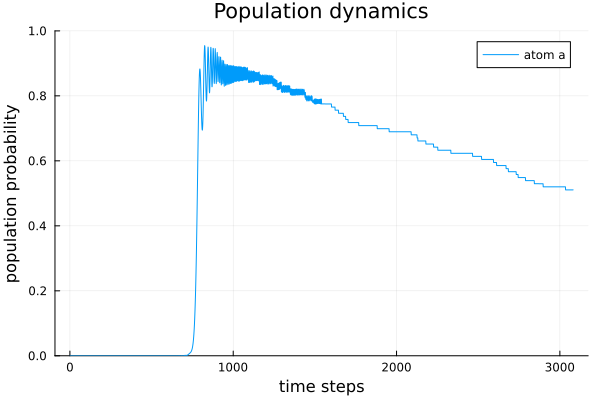

In [ ]:
plot(avg_population_data[:abc],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Fidelity dynamics before protocol")

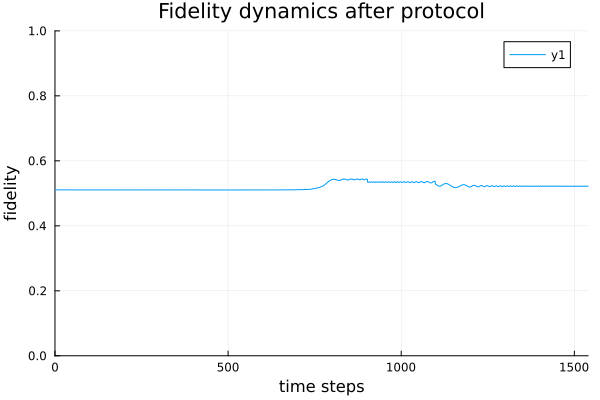

In [10]:
plot(avg_fidelity_data, xlim=[0,10*tspan2[end]], ylim=[0,1], xlabel="time steps", ylabel="fidelity", title="Fidelity dynamics after protocol")

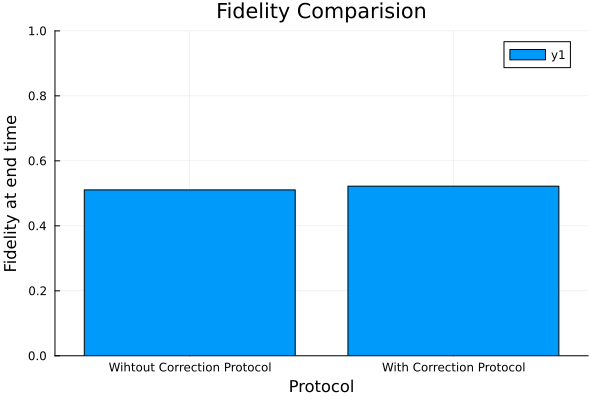

In [ ]:
x = ["Wihtout Correction Protocol", "With Correction Protocol"]
y = [avg_population_data[:abc][end], avg_fidelity_data[1540]]
bar(x,y, title="Fidelity Comparision", xlabel="Protocol", ylabel="Fidelity at end time")

In [58]:
println("Fidelity at end time without correction protocol: ", avg_population_data[:abc][end])
println("Fidelity at end time with correction protocol: ", avg_fidelity_data[1540])

Fidelity at end time without correction protocol: 0.5106162886102729
Fidelity at end time with correction protocol: 0.5220826632324953


## Gamma = 1e-4


### Analyzing Single Trajectories

In [24]:
2*(V_nn) + V_nn/2^6

-2015.625

In [21]:
Δb_0 - δ*tspan3[end]

1998.92

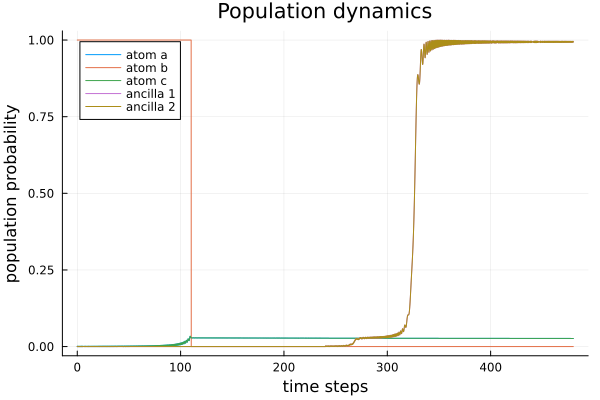

In [106]:
# Try trajectory 2,9,15
## Troublesome trajectory 20
@load "Z:/master_work/5_atom_correction/decay_1e_4/N_atoms=5_γ_decay=0.0001_Ntraj=15.jld2"

population_data = population_data;
corrected_population_data = corrected_population_data;
fidelity_data = fidelity_data;

plot(tspan, population_data[:a], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(tspan, population_data[:b], label="atom b")
plot!(tspan, population_data[:c], label="atom c")
plot!(tspan, population_data[:a1],label="ancilla 1")
plot!(tspan, population_data[:a2], label="ancilla 2")

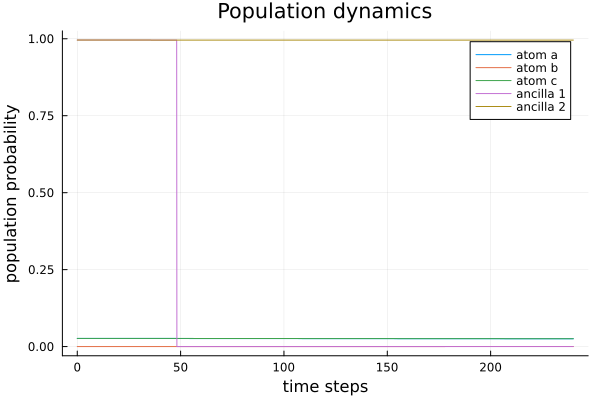

In [104]:
plot(tspan2, corrected_population_data[:a], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(tspan2, corrected_population_data[:b], label="atom b")
plot!(tspan2, corrected_population_data[:c], label="atom c")
plot!(tspan2, corrected_population_data[:a1],label="ancilla 1")
plot!(tspan2, corrected_population_data[:a2], label="ancilla 2")

### Average analysis

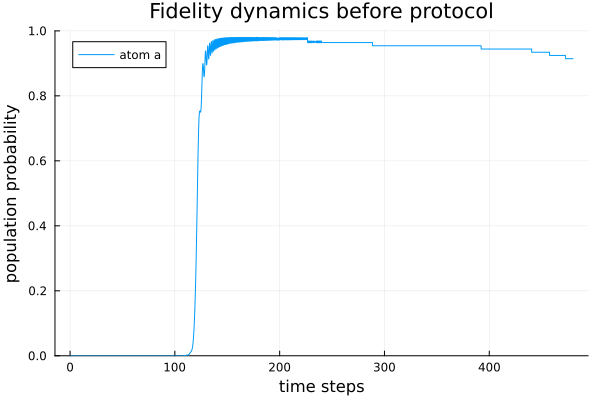

In [98]:
@load "Z:/master_work/5_atom_correction/decay_1e_4/N_atoms=5_γ_decay=0.0001_Ntraj=100_avg.jld2"

avg_population_data = avg_population_data;
avg_corrected_population_data = avg_corrected_population_data;
avg_fidelity_data = avg_fidelity_data;

plot(tspan, avg_population_data[:abc],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Fidelity dynamics before protocol")

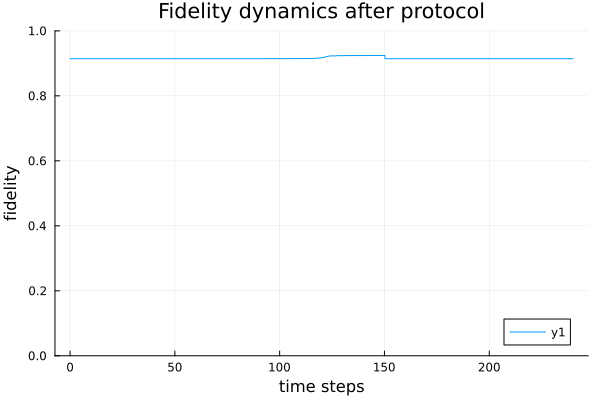

In [94]:
plot(tspan2,avg_fidelity_data, ylim=[0,1], xlabel="time steps", ylabel="fidelity", title="Fidelity dynamics after protocol")

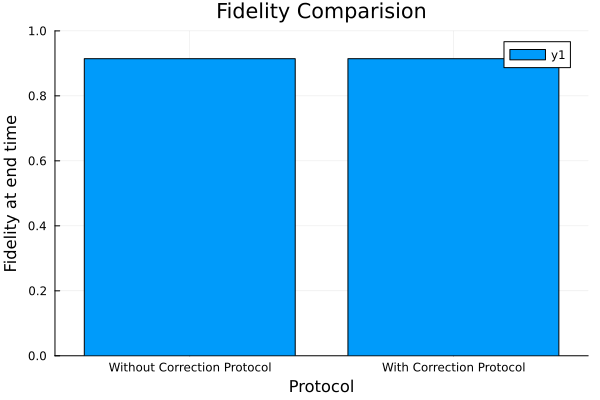

In [95]:
x = ["Without Correction Protocol", "With Correction Protocol"]
y = [avg_population_data[:abc][end], avg_fidelity_data[end]]
bar(x,y, ylim=[0,1], title="Fidelity Comparision", xlabel="Protocol", ylabel="Fidelity at end time")

In [96]:
println("Fidelity at end time without correction protocol: ", avg_population_data[:abc][end])
println("Fidelity at end time with correction protocol: ", avg_fidelity_data[end])

Fidelity at end time without correction protocol: 0.9143817379890242
Fidelity at end time with correction protocol: 0.9143736983183822
